# Models pipeline test
Este notebook presenta un pipeline para evaluar el rendimiento de diferentes modelos

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from skopt.space import Real, Integer, Categorical
from skopt import BayesSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

In [2]:
dataset = pd.read_excel('fwod_representations_clean.xlsx')

## Protocol
---

In [3]:
X = dataset.filter(like='step_').values
y = dataset['class'].values
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Machine learning

## Search Spaces

In [4]:
# Define hyperparameter search spaces
from skopt.space import Real, Integer
search_spaces = {
    "Random_Forest": {
		"n_estimators": Integer(50, 300),
		"max_depth": Integer(5, 50)
	},
    "SVM": {
		"C": Real(0.1, 10),
		"gamma": Real(0.01, 1)
	},
    'xgb': {
		"n_estimators": Integer(50, 300),  # Number of trees
		"max_depth": Integer(3, 10),       # Tree depth
		"learning_rate": Real(0.01, 0.3, prior="log-uniform"),  # Step size shrinkage
		"subsample": Real(0.5, 1.0),       # Sampling ratio
		"colsample_bytree": Real(0.5, 1.0) # Feature sampling ratio
	},
    'knn': {
		"n_neighbors": Integer(1, 30),          # Number of neighbors
		"weights": Categorical(["uniform", "distance"]),  # Weight function
		"metric": Categorical(["minkowski", "manhattan", "euclidean"])  # Distance metric
	}
}


## Random forest

In [12]:
rf_model = RandomForestClassifier(random_state=42)

In [20]:
opt_rf = BayesSearchCV(
    rf_model,
    search_spaces['Random_Forest'],
    n_iter=20,  # Number of parameter evaluations
    cv=5,       # Cross-validation folds
    scoring='accuracy',
    random_state=42
)

opt_rf.fit(X_train, y_train)
# Best parameters and score
print("Best parameters for Random Forest:", opt_rf.best_params_)
print("Best cross-validation accuracy:", opt_rf.best_score_)

Best parameters for Random Forest: OrderedDict([('max_depth', 38), ('n_estimators', 285)])
Best cross-validation accuracy: 0.6239974739501105


Best parameters for Random Forest: OrderedDict([('max_depth', 38), ('n_estimators', 285)])
Best cross-validation accuracy: 0.6239974739501105


## SVM

In [24]:
svm_model = SVC(kernel="rbf", random_state=42)
opt_svm = BayesSearchCV(
    svm_model,
    search_spaces['SVM'],
    n_iter=20,
    cv=5,
    scoring='accuracy',
    random_state=42
)

opt_svm.fit(X_train, y_train)

# Best parameters and score
print("Best parameters for SVM:", opt_svm.best_params_)
print("Best cross-validation accuracy:", opt_svm.best_score_)

Best parameters for SVM: OrderedDict([('C', 3.7518321939109605), ('gamma', 0.9995336846210754)])
Best cross-validation accuracy: 0.6003157562361856


Best parameters for SVM: OrderedDict([('C', 3.7518321939109605), ('gamma', 0.9995336846210754)])
Best cross-validation accuracy: 0.6003157562361856


## XGBooost

In [5]:
from sklearn.preprocessing import LabelEncoder

# Initialize the encoder
label_encoder = LabelEncoder()

# Encode the class labels
y_encoded = label_encoder.fit_transform(y)

# Now split the dataset with the encoded labels
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)


In [29]:
from xgboost import XGBClassifier
from skopt import BayesSearchCV

# Initialize the model
xgb_model = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric="logloss")

# Perform Bayesian Optimization
opt_xgb = BayesSearchCV(
    xgb_model,
    search_spaces['xgb'],
    n_iter=20,  # Number of iterations to explore the parameter space
    cv=5,       # 5-fold cross-validation
    scoring="accuracy",
    random_state=42
)

# Fit on the training data
opt_xgb.fit(X_train, y_train)

# Output the best parameters and performance
print("Best parameters for XGBoost:", opt_xgb.best_params_)
print("Best cross-validation accuracy for XGBoost:", opt_xgb.best_score_)


/Users/danielmartinezvillegas/anaconda3/envs/test_env/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [22:10:08] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/danielmartinezvillegas/anaconda3/envs/test_env/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [22:10:17] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/danielmartinezvillegas/anaconda3/envs/test_env/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [22:10:26] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/danielmartinezvillegas/anaconda3/envs/test_env/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [22:10:35] WARNING: /Users/runner/work/xgboost

Best parameters for XGBoost: OrderedDict([('colsample_bytree', 1.0), ('learning_rate', 0.29999999999999993), ('max_depth', 8), ('n_estimators', 300), ('subsample', 1.0)])
Best cross-validation accuracy for XGBoost: 0.6505209977897064


Best parameters for XGBoost: OrderedDict([('colsample_bytree', 1.0), ('learning_rate', 0.29999999999999993), ('max_depth', 8), ('n_estimators', 300), ('subsample', 1.0)])

In [35]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Initialize the model with the best parameters
best_xgb = XGBClassifier(
    colsample_bytree=1.0,
    learning_rate=0.3,  # Rounded to the nearest reasonable precision
    max_depth=8,
    n_estimators=300,
    subsample=1.0,
    random_state=42,
    use_label_encoder=False,
    eval_metric="logloss"
)

# Fit the model on the training data
best_xgb.fit(X_train, y_train)

# Predict on the test set
y_pred = best_xgb.predict(X_test)


/Users/danielmartinezvillegas/anaconda3/envs/test_env/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:15:42] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


In [36]:
# Decode predictions if using label encoding
y_pred_decoded = label_encoder.inverse_transform(y_pred)
y_test_decoded = label_encoder.inverse_transform(y_test)

# Calculate accuracy
test_accuracy = accuracy_score(y_test_decoded, y_pred_decoded)
print(f"Test Accuracy: {test_accuracy}")

# Detailed classification report
print("\nClassification Report:")
print(classification_report(y_test_decoded, y_pred_decoded))

# Confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(y_test_decoded, y_pred_decoded))


Test Accuracy: 0.6665824703207881

Classification Report:
               precision    recall  f1-score   support

     afrobeat       0.78      0.57      0.66       197
    afrocuban       0.67      0.55      0.61       155
        blues       0.50      0.17      0.25        18
        boska       1.00      0.50      0.67         2
      country       0.58      0.29      0.39        24
        dance       0.77      0.52      0.62       110
         funk       0.66      0.61      0.63       464
       gospel       0.57      0.31      0.40        13
     highlife       0.75      0.31      0.44        29
       hiphop       0.77      0.55      0.64       163
         jazz       0.74      0.62      0.67       447
        latin       0.65      0.77      0.70       713
middleeastern       0.94      0.71      0.81        24
   neworleans       0.74      0.53      0.62       146
          pop       0.75      0.41      0.53        51
         punk       0.62      0.33      0.43        55
      

Test Accuracy: 0.6665824703207881

## lightgbm

In [30]:
from skopt.space import Integer, Real

# Define the search space
search_space_lgb = {
    "num_leaves": Integer(20, 100),          # Number of leaves in each tree
    "max_depth": Integer(3, 10),            # Maximum depth of the trees
    "learning_rate": Real(0.01, 0.3, prior="log-uniform"),  # Step size
    "n_estimators": Integer(50, 300),       # Number of boosting iterations
    "subsample": Real(0.5, 1.0),            # Fraction of data to sample per tree
    "colsample_bytree": Real(0.5, 1.0)      # Fraction of features to sample per tree
}


In [31]:
from lightgbm import LGBMClassifier
from skopt import BayesSearchCV

# Initialize the LightGBM model
lgb_model = LGBMClassifier(random_state=42)

# Perform Bayesian Optimization
opt_lgb = BayesSearchCV(
    lgb_model,
    search_space_lgb,
    n_iter=20,  # Number of iterations
    cv=5,       # 5-fold cross-validation
    scoring="accuracy",
    random_state=42
)

# Fit the model on the training data
opt_lgb.fit(X_train, y_train)

# Output the best parameters and performance
print("Best parameters for LightGBM:", opt_lgb.best_params_)
print("Best cross-validation accuracy for LightGBM:", opt_lgb.best_score_)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4080
[LightGBM] [Info] Number of data points in the train set: 12668, number of used features: 16
[LightGBM] [Info] Start training from score -3.002703
[LightGBM] [Info] Start training from score -3.242277
[LightGBM] [Info] Start training from score -5.386391
[LightGBM] [Info] Start training from score -7.500924
[LightGBM] [Info] Start training from score -5.103029
[LightGBM] [Info] Start training from score -3.586048
[LightGBM] [Info] Start training from score -2.142991
[LightGBM] [Info] Start training from score -5.662645
[LightGBM] [Info] Start training from score -4.925046
[LightGBM] [Info] Start training from score -3.193006
[LightGBM] [Info] Start training from score -2.182104
[LightGBM] [Info] Start training from score -1.713589
[LightGBM] [Info] Start training from score -5.129346
[LightGBM

Best parameters for LightGBM: OrderedDict([('colsample_bytree', 0.9205019586952579), ('learning_rate', 0.03306030825119106), ('max_depth', 10), ('n_estimators', 292), ('num_leaves', 89), ('subsample', 0.691935556767604)])
Best cross-validation accuracy for LightGBM: 0.6394063782759709

## KNN

In [28]:
from sklearn.neighbors import KNeighborsClassifier
from skopt import BayesSearchCV

# Initialize the KNN model
knn_model = KNeighborsClassifier()

# Perform Bayesian Optimization
opt_knn = BayesSearchCV(
    knn_model,
    search_spaces['knn'],
    n_iter=20,  # Number of iterations
    cv=5,       # 5-fold cross-validation
    scoring="accuracy",
    random_state=42
)

# Fit the model on the training data
opt_knn.fit(X_train, y_train)

# Output the best parameters and performance
print("Best parameters for KNN:", opt_knn.best_params_)
print("Best cross-validation accuracy for KNN:", opt_knn.best_score_)


Best parameters for KNN: OrderedDict([('metric', 'manhattan'), ('n_neighbors', 7), ('weights', 'distance')])
Best cross-validation accuracy for KNN: 0.6310122813040957


Best parameters for KNN: OrderedDict([('metric', 'manhattan'), ('n_neighbors', 9), ('weights', 'distance')])
Best cross-validation accuracy for KNN: 0.630880959898958

In [29]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Use the best model to predict on the test set
y_pred = opt_knn.best_estimator_.predict(X_test)

# Decode predictions if using encoded labels
y_pred_decoded = label_encoder.inverse_transform(y_pred)
y_test_decoded = label_encoder.inverse_transform(y_test)

# Evaluate the model
test_accuracy = accuracy_score(y_test_decoded, y_pred_decoded)
print(f"Test Accuracy: {test_accuracy}")

print("\nClassification Report:")
print(classification_report(y_test_decoded, y_pred_decoded))

print("\nConfusion Matrix:")
print(confusion_matrix(y_test_decoded, y_pred_decoded))


Test Accuracy: 0.6447534766118836

Classification Report:
               precision    recall  f1-score   support

     afrobeat       0.74      0.54      0.63       197
    afrocuban       0.63      0.61      0.62       155
        blues       0.50      0.22      0.31        18
      country       0.62      0.33      0.43        24
        dance       0.63      0.53      0.57       110
         funk       0.62      0.63      0.62       464
       gospel       0.47      0.54      0.50        13
     highlife       0.58      0.38      0.46        29
       hiphop       0.65      0.56      0.60       163
         jazz       0.65      0.58      0.61       447
        latin       0.65      0.76      0.70       713
middleeastern       0.89      0.71      0.79        24
   neworleans       0.62      0.49      0.55       146
          pop       0.57      0.45      0.51        51
         punk       0.49      0.31      0.38        55
       reggae       0.60      0.48      0.53        56
      

Test Accuracy: 0.6435968678959333

# Deep learning 

## LSTM
LSTMs expect data in a 3D shape: (samples, timesteps, features). Since the dataset consists of 16 steps (FWOD), we'll reshape the input accordingly.

In [6]:
import numpy as np
from tensorflow.keras.utils import to_categorical

# Reshape data for LSTM (samples, timesteps, features)
X_train_lstm = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test_lstm = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

# Convert labels to categorical for multi-class classification
y_train_lstm = to_categorical(y_train, num_classes=len(np.unique(y_train)))
y_test_lstm = to_categorical(y_test, num_classes=len(np.unique(y_test)))

print("Input shape for LSTM:", X_train_lstm.shape)
print("Output shape (one-hot):", y_train_lstm.shape)


Input shape for LSTM: (15819, 16, 1)
Output shape (one-hot): (15819, 18)


In [7]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.regularizers import l2

# Build the LSTM model

# Architecure with 54% in validation
# model = Sequential([
#     LSTM(64, activation='tanh', return_sequences=True, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])),
#     BatchNormalization(),
#     Dropout(0.3),
#     LSTM(32, activation='tanh'),
#     BatchNormalization(),
#     Dropout(0.3),
#     Dense(64, activation='relu'),
#     BatchNormalization(),
#     Dense(len(np.unique(y_train)), activation='softmax')
# ])

# Architecure with 55% in validation
# model = Sequential([
#     Bidirectional(LSTM(64, activation='tanh', return_sequences=True, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2]))),
#     BatchNormalization(),
#     Dropout(0.3),
#     Bidirectional(LSTM(32, activation='tanh')),
#     BatchNormalization(),
#     Dropout(0.3),
#     Dense(64, activation='relu'),
#     BatchNormalization(),
#     Dense(len(np.unique(y_train)), activation='softmax')
# ])

# model = Sequential([
#     LSTM(64, activation='relu', return_sequences=True, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])),
#     Dropout(0.4),
#     LSTM(64, activation='relu', return_sequences=True, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2]), kernel_regularizer=l2(0.01)),
#     Dropout(0.4),
#     Dense(64, activation='swish', kernel_regularizer=l2(0.01)),
#     Dense(len(np.unique(y_train)), activation='softmax')
# ])

lstm_model = Sequential([
    LSTM(64, activation='tanh', input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2]), return_sequences=True),
    Dropout(0.3),
    LSTM(32, activation='tanh'),
    Dropout(0.3),
    Dense(64, activation='relu'),
    Dense(len(np.unique(y_train)), activation='softmax')  # Number of classes
])


# Compile the model
lstm_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
lstm_model.summary()


2024-12-01 12:33:30.608600: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2 Pro
2024-12-01 12:33:30.608633: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2024-12-01 12:33:30.608642: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2024-12-01 12:33:30.608914: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-12-01 12:33:30.608935: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
/Users/danielmartinezvillegas/anaconda3/envs/tf-macos/lib/python3.9/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 16, 64)         │        16,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 18)             │         1,170 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 32,594 (127.32 KB)

 Trainable params: 32,594 (127.32 KB)

 Non-trainable params: 0 (0.00 B)

In [8]:
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history = lstm_model.fit(
    X_train_lstm,
    y_train_lstm,
    validation_data=(X_test_lstm, y_test_lstm),
    epochs=50,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/50


2024-12-01 12:33:36.008794: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


495/495 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.3029 - loss: 2.3082 - val_accuracy: 0.3292 - val_loss: 2.1118
Epoch 2/50
495/495 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.3273 - loss: 2.1332 - val_accuracy: 0.3302 - val_loss: 2.1134
Epoch 3/50
495/495 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.3290 - loss: 2.0959 - val_accuracy: 0.3408 - val_loss: 2.0665
Epoch 4/50
495/495 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.3510 - loss: 2.0641 - val_accuracy: 0.3527 - val_loss: 2.0589
Epoch 5/50
495/495 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.3491 - loss: 2.0552 - val_accuracy: 0.3509 - val_loss: 2.0309
Epoch 6/50
495/495 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.3533 - loss: 2.0456 - val_accuracy: 0.3484 - val_loss: 2.0446
Epoch 7/50
495/495 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - accuracy: 0.3546 - loss: 2.0386 - val_accuracy: 0.3593 - val_loss: 2.0103
Epoch 8/50
495/495 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - accuracy: 0.3607 - loss: 2.0298 - val_accuracy: 0

---

In [45]:
# Evaluate the model
test_loss, test_accuracy = lstm_model.evaluate(X_test_lstm, y_test_lstm, verbose=0)
print(f"LSTM Test Accuracy: {test_accuracy}")

# Predict class probabilities and decode to class labels
y_pred_lstm = np.argmax(lstm_model.predict(X_test_lstm), axis=1)
y_test_decoded = np.argmax(y_test_lstm, axis=1)

# Metrics
from sklearn.metrics import classification_report, confusion_matrix

print("\nClassification Report:")
print(classification_report(y_test_decoded, y_pred_lstm))

print("\nConfusion Matrix:")
print(confusion_matrix(y_test_decoded, y_pred_lstm))


LSTM Test Accuracy: 0.555443286895752
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.46      0.52      0.49       197
           1       0.54      0.45      0.49       155
           2       0.17      0.06      0.08        18
           3       0.00      0.00      0.00         2
           4       0.17      0.08      0.11        24
           5       0.60      0.45      0.51       110
           6       0.55      0.48      0.51       464
           7       0.17      0.08      0.11        13
           8       0.25      0.45      0.32        29
           9       0.64      0.43      0.51       163
          10       0.56      0.50      0.53       447
          11       0.53      0.69      0.60       713
          12       0.80      0.67      0.73        24
          13       0.53      0.34      0.41       146
          14       0.49      0.43      0.46        51
          15       0.35      0.2

/Users/danielmartinezvillegas/anaconda3/envs/tf-macos/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/danielmartinezvillegas/anaconda3/envs/tf-macos/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/danielmartinezvillegas/anaconda3/envs/tf-macos/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

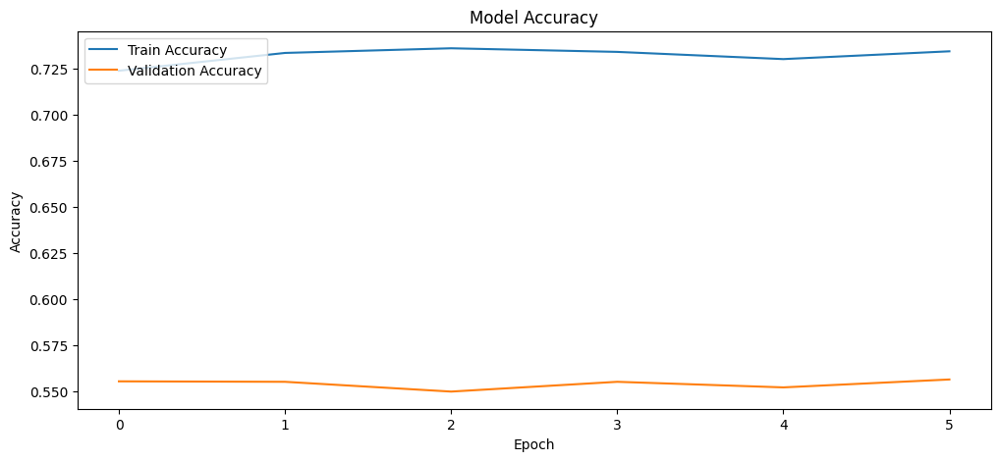

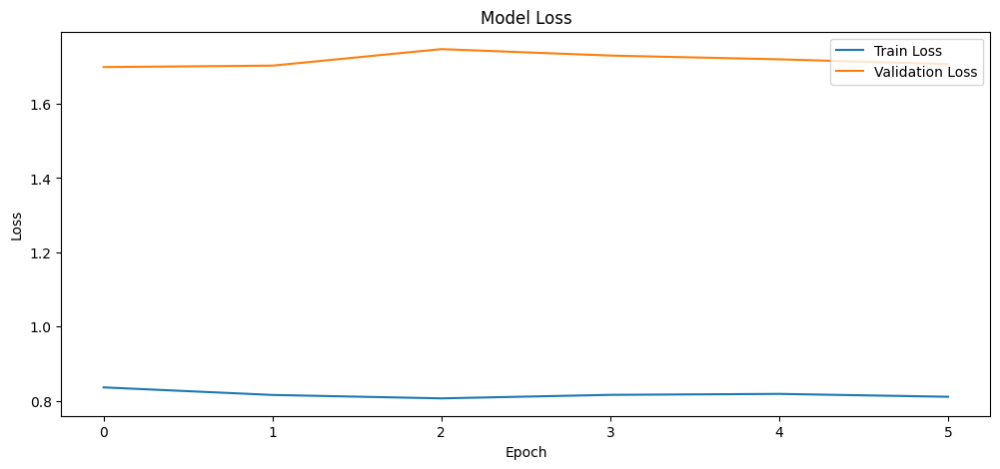

In [46]:
import matplotlib.pyplot as plt

# Plot accuracy
plt.figure(figsize=(12, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.show()

# Plot loss
plt.figure(figsize=(12, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.show()
